# EECS 598 Lab 10: Habitat Simulator Intro
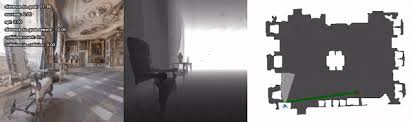

This notebook is worth **80 points**. Your score will be calculated as `score = min(score, 80)`.
Questions and implementations are marked with relevent `#TODO(student)` markers.

Before starting the assignment, please put your name and UMID in the following format:

Firstname LASTNAME, #00000000 (ex. Drew SCHEFFER #31415926)

**YOUR ANSWER**

SHIVAM UDESHI, #87841376

# HabitatSim Setup

In [1]:
!pip install seaborn

## Setup (Local Machine)
If you're using a local machine, follow the [installation instructions on the HabitatSim Github](https://github.com/facebookresearch/habitat-sim?tab=readme-ov-file#installation). If you have conda, that's typically the quickest way to get things set up.

## Setup (Colab)
HabitatSim actually officially dropped support for Colab quite recently... That doesn't stop us though! Below, we'll download a custom conda build I made so things work.

First we'll install miniconda in Colab

In [2]:
!wget -c https://repo.continuum.io/miniconda/Miniconda3-latest-Linux-x86_64.sh
!bash Miniconda3-latest-Linux-x86_64.sh -bfp /usr/local

--2025-11-05 23:08:12--  https://repo.continuum.io/miniconda/Miniconda3-latest-Linux-x86_64.sh
Resolving repo.continuum.io (repo.continuum.io)... 104.18.176.84, 104.18.177.84, 2606:4700::6812:b154, ...
Connecting to repo.continuum.io (repo.continuum.io)|104.18.176.84|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh [following]
--2025-11-05 23:08:12--  https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.191.158, 104.16.32.241, 2606:4700::6810:bf9e, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.191.158|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156323998 (149M) [application/octet-stream]
Saving to: ‘Miniconda3-latest-Linux-x86_64.sh’

Miniconda3-latest-L 100%[===================>] 149.08M   187MB/s    in 0.8s    

2025-11-05 23:08:13 (187 MB/s) - ‘Minicond

Then, we'll download the custom conda build for python 3.12 using gdown

In [3]:
!pip install gdown -q
!gdown "https://drive.google.com/uc?id=1zE7ATGuIlIqQV6pct-w58LhET6CtCIeE"

Downloading...
From (original): https://drive.google.com/uc?id=1zE7ATGuIlIqQV6pct-w58LhET6CtCIeE
From (redirected): https://drive.google.com/uc?id=1zE7ATGuIlIqQV6pct-w58LhET6CtCIeE&confirm=t&uuid=05938a5b-8566-455a-b7a3-0d88ce57f1ac
To: /content/habitat-sim-0.3.3-py3.12_headless_linux_6c26c4f9ae10ad7f534aa9e59a84dff00782741e.conda
100% 192M/192M [00:00<00:00, 209MB/s]


In [4]:
!conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/main
!conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/r
!conda install habitat-sim-0.3.3-py3.12_headless_linux_6c26c4f9ae10ad7f534aa9e59a84dff00782741e.conda

accepted Terms of Service for https://repo.anaconda.com/pkgs/main
accepted Terms of Service for https://repo.anaconda.com/pkgs/r
Jupyter detected...
2 channel Terms of Service accepted
Retrieving notices: - \ | / - \ | / - \ done

                                   

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - <unknown>/linux-64::habitat-sim==0.3.3=py3.12_headless_linux_6c26c4f9ae10ad7f534aa9e59a84dff00782741e


The following NEW packages will be INSTALLED:

  habitat-sim        <unknown>/linux-64::habitat-sim-0.3.3-py3.12_headless_linux_6c26c4f9ae10ad7f534aa9e59a84dff00782741e 




Preparing transaction: / done
Verifying transaction: \ done
Executing transaction: / done


Install some other necessary dependencies

In [5]:
!/usr/bin/python3 -m pip install \
  "attrs>=19.1.0" \
  numpy-quaternion \
  gitpython \
  imageio \
  imageio-ffmpeg \
  matplotlib \
  numba \
  pillow==10.4.0 \
  "scipy>=1.10.1" \
  tqdm \
  "numpy==1.26.4"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 76.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 128.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 kB 19.8 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: pillow 11.3.0
    Uninstalling pillow-11.3.0:
      Successfully uninstalled pillow-11.3.0
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
pytensor 2.35.1 requires numpy>=2.0, but you have numpy 1.26.4 which is 

1. You can **IGNORE** the errors above.
2. But make sure to **RESTART YOUR SESSION.**
3. Continue running from the cell below

Note, that every time you reset the session, just run the cell below.

In [1]:
import sys
sys.path.append('/usr/local/lib/python3.12/site-packages')

# Download the Data
To view a full list of the datasets available for download checkout [this readme](https://github.com/facebookresearch/habitat-lab/blob/main/DATASETS.md).

To get access to the download scipt to several of these datasets (ex. all MP3D scans), you have to fill out an agreement and send in your responses via email which can take a while: [Matterport3D](https://niessner.github.io/Matterport/).

For this lab, we'll just be using the *habitat_test_scenes*.

In [2]:
# The following should work if you're not using colab
!python -m habitat_sim.utils.datasets_download --uids habitat_test_scenes --data-path data/

/usr/local/bin/python: Error while finding module specification for 'habitat_sim.utils.datasets_download' (ModuleNotFoundError: No module named 'habitat_sim')


In [3]:
# In colab, try this
import habitat_sim.utils.datasets_download as dd
dd.main(["--uids", "habitat_test_scenes", "--data-path", "data/"])

git clone --depth 1 --branch main https://huggingface.co/datasets/ai-habitat/habitat_test_scenes.git /content/data/versioned_data/habitat_test_scenes
Dataset (habitat_test_scenes) successfully downloaded.
Source: '/content/data/versioned_data/habitat_test_scenes'
Symlink: '/content/data/scene_datasets/habitat-test-scenes'


# An Introduction to Habitat
As a recap from last lab there's two main components to Habitat:
1. [HabitatSim](https://github.com/facebookresearch/habitat-sim): a flexible, high performance 3D simulator defining configurable agents, multiple sensors, high throughput rendering, and generic 3D dataset handling.
2. [HabitatLab](https://github.com/facebookresearch/habitat-lab): a modular high-level library for end-to-end development for embodied AI tasks.

Additionally, there are also [Habitat Challenges](https://aihabitat.org/challenge/2023/) for specific tasks (i.e. PointGoal Navigation, Rearrangement, etc).


Today, we'll mainly be focusing on **HabitatSim**. The basic workflow of HabitatSim for navigation is the following:
- config and start the simulator
- load a scene
- setup an agent with a sensor
- instruct the agent to move somehow
- obtain the observations.


# Setting Up Your First Environment with HabitatSim

Now, we'll set up our first envirionment! This involves three main steps:
1. Configure the sensors
2. Configure the agent
3. Configure the simulator backend / scene

In [4]:
import random

from PIL import Image

%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np

import habitat_sim

# Plotting
import seaborn as sns
import matplotlib
matplotlib.rcParams["figure.dpi"] = 100
sns.set_style("whitegrid")

### Sensor Configuration
First, we'll configure the sensors. In this environment we'll set up an RGB "color_sensor" and depth depth sensor.

You can customize many properties of the sensors, such as spatial resolution, position, rotation, etc.

In [5]:
sensor_settings = {
    "height": 256, "width": 256,  # Spatial resolution of observations
    "sensor_height": 1.5,  # Height of sensors in meters, relative to the agent
}

# Create a RGB sensor configuration
rgb_sensor_spec = habitat_sim.CameraSensorSpec()
rgb_sensor_spec.uuid = "color_sensor"
rgb_sensor_spec.sensor_type = habitat_sim.SensorType.COLOR
rgb_sensor_spec.resolution = [sensor_settings["height"], sensor_settings["width"]]
rgb_sensor_spec.position = [0.0, sensor_settings["sensor_height"], 0.0]
rgb_sensor_spec.sensor_subtype = habitat_sim.SensorSubType.PINHOLE

# Create a depth sensor configuration
depth_sensor_spec = habitat_sim.CameraSensorSpec()
depth_sensor_spec.uuid = "depth_sensor"
depth_sensor_spec.sensor_type = habitat_sim.SensorType.DEPTH
depth_sensor_spec.resolution = [sensor_settings["height"], sensor_settings["width"]]
depth_sensor_spec.position = [0.0, sensor_settings["sensor_height"], 0.0]
depth_sensor_spec.sensor_subtype = habitat_sim.SensorSubType.PINHOLE

sensor_specs = [rgb_sensor_spec, depth_sensor_spec]

print(sensor_specs)

[<habitat_sim._ext.habitat_sim_bindings.CameraSensorSpec object at 0x7d78db66e3f0>, <habitat_sim._ext.habitat_sim_bindings.CameraSensorSpec object at 0x7d78cdb8fc50>]


### Agent Configuration

Next, we'll set up the configuration for the agent in the simulator.

Here, we specify the action space of the agent:
- the distance to move forward during a move action
- the angle magnitudes to turn during a turn action

Note that the agent configuration also contains all of the sensor configurations. This is because the sensors are rigidly attached to the agent, and renderning will be affected based on how the agent moves.

In [6]:
agent_settings = {
    "action_space": {
        "move_forward": 0.25, "move_backward": 0.25,  # Distance to cover in a move action in meters
        "turn_left": 30.0, "turn_right": 30,  # Angles to cover in a turn action in degrees
    }
}

# Create an agent configuration
agent_cfg = habitat_sim.agent.AgentConfiguration()
agent_cfg.action_space = {
    k: habitat_sim.agent.ActionSpec(
        k, habitat_sim.agent.ActuationSpec(amount=v)
    ) for k, v in agent_settings["action_space"].items()
}
agent_cfg.sensor_specifications = sensor_specs

### Simulator Configuration
Finally, we'll set up the configuration for the simulator backend. This includes specifying which scene file we'll use, whether to enable physics, and which device to use for rendering.

In [7]:
sim_settings = {
    "default_agent": 0,  # Index of the default agent
    "scene_id": "data/scene_datasets/habitat-test-scenes/apartment_1.glb",  # Scene file, episode 0 in val split of Gibson
    "enable_physics": False,  # kinematics only
    "seed": 42  # used in the random navigation
}

# Create a simulator backend configuration
sim_cfg = habitat_sim.SimulatorConfiguration()
sim_cfg.scene_id = sim_settings["scene_id"]
sim_cfg.enable_physics = sim_settings["enable_physics"]
sim_cfg.gpu_device_id = -1 # CPU rendering

Now we'll use the configurations we just made to make a *master* configuration object for the whole simulation.

In [8]:
# Create a configuration for the simulator
cfg = habitat_sim.Configuration(sim_cfg, [agent_cfg])

### Create a Simulator Instance
Use the master configuration to make the simulator!

In [9]:
try:
    sim.close()
except NameError:
    pass
sim = habitat_sim.Simulator(cfg)
agent = sim.initialize_agent(sim_settings["default_agent"])  # Get our default agent


# Manual Navigation
Now that you have set up the simulator, you can take manual discrete actions and render the sensor outputs at each simulation step!

In [10]:
# Set the random seed for funsies
random.seed(sim_settings["seed"])
sim.seed(sim_settings["seed"])

First, we'll set up this utility function used for rendering the RGB + D information to the screen

In [11]:
# A utility function for displaying observations
def display_obs(rgb_obs: np.ndarray, depth_obs: np.ndarray):
    img_arr, title_arr = [], []

    rgb_img = Image.fromarray(rgb_obs, mode="RGBA")
    img_arr.append(rgb_img)
    title_arr.append("rgb")

    depth_img = Image.fromarray((depth_obs / 10 * 255).astype(np.uint8), mode="L")
    img_arr.append(depth_img)
    title_arr.append("depth")

    plt.figure(figsize=(12, 8))
    for i, (img, title) in enumerate(zip(img_arr, title_arr)):
        ax = plt.subplot(1, 2, i + 1)
        ax.axis("off")
        ax.set_title(title)
        plt.imshow(img)
    plt.show(block=False)

Now, we'll hardcode the agen't position to something reasonable.

In [12]:
# Set agent state
agent_state = habitat_sim.AgentState()
agent_state.position = np.array([0.0, -1.51, -0.6])  # Position in world coordinate
agent_state.rotation = np.array([0, 0, 0, 1])  # Orientation quaternion wrt world frame (identity)
agent.set_state(agent_state)

# Get agent state
agent_state = agent.get_state()
print(f"Agent state: position ({agent_state.position}), rotation ({agent_state.rotation})")

Agent state: position ([ 0.   -1.51 -0.6 ]), rotation (quaternion(1, 0, 0, 0))


Now, you can step through the environment manually using your keyboard. You can specify one of the four discrete actions (`move_forward`, `turn_left`, `move_backward`, `turn_right`) by pressing (`W`, `A`, `S`, `D`) respectively.

`TODO(student):` Update the code below to successfully retrieve observations from the simulator and render them using `display_obs()` **(10 points)**

Use WASD to control the agent now (Q to quit): d
Choose to turn_right


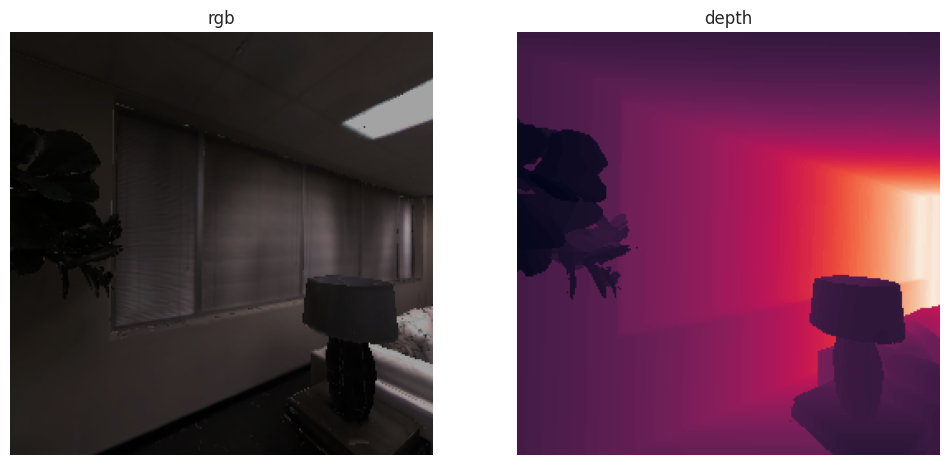

Use WASD to control the agent now (Q to quit): d
Choose to turn_right


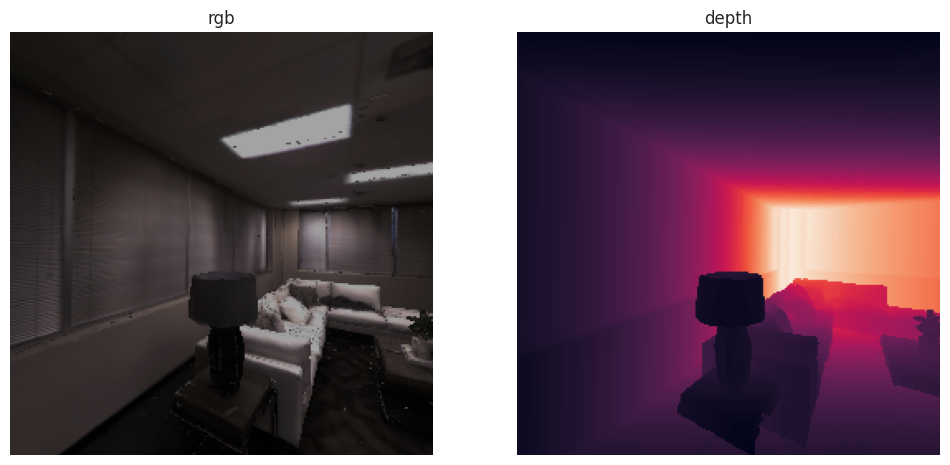

Use WASD to control the agent now (Q to quit): d
Choose to turn_right


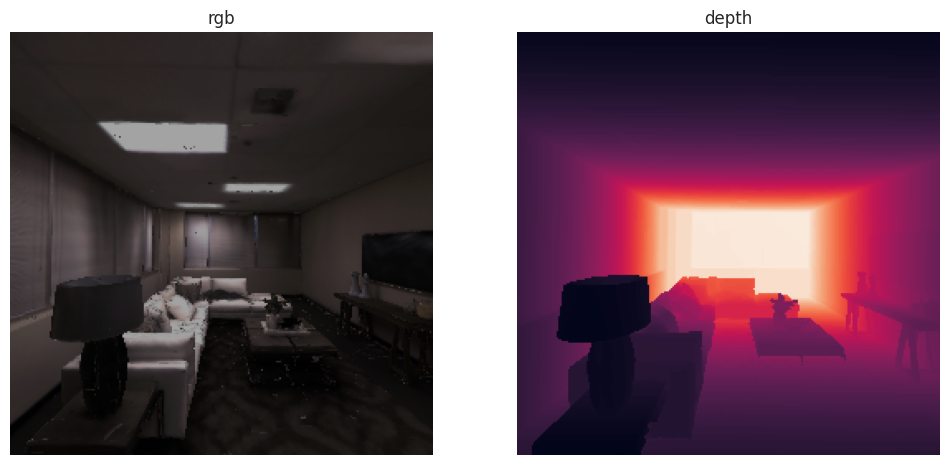

Use WASD to control the agent now (Q to quit): d
Choose to turn_right


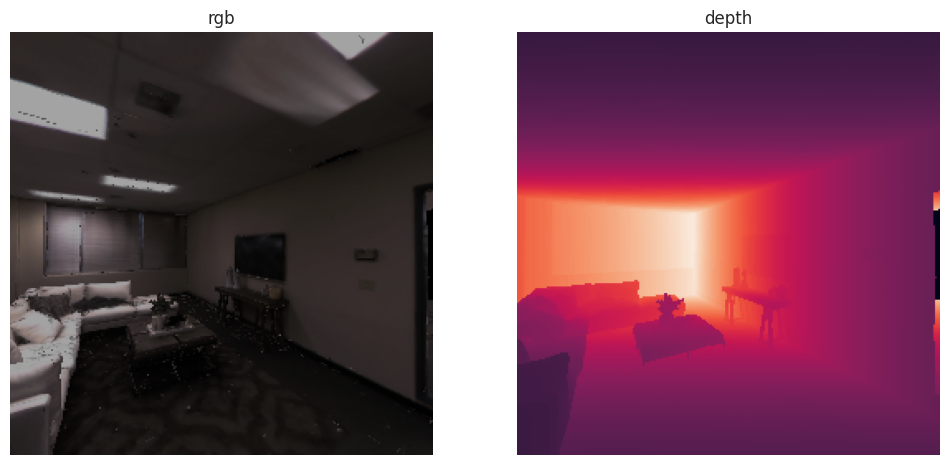

Use WASD to control the agent now (Q to quit): 
Invalid input . Please only use WASD!
Use WASD to control the agent now (Q to quit): d
Choose to turn_right


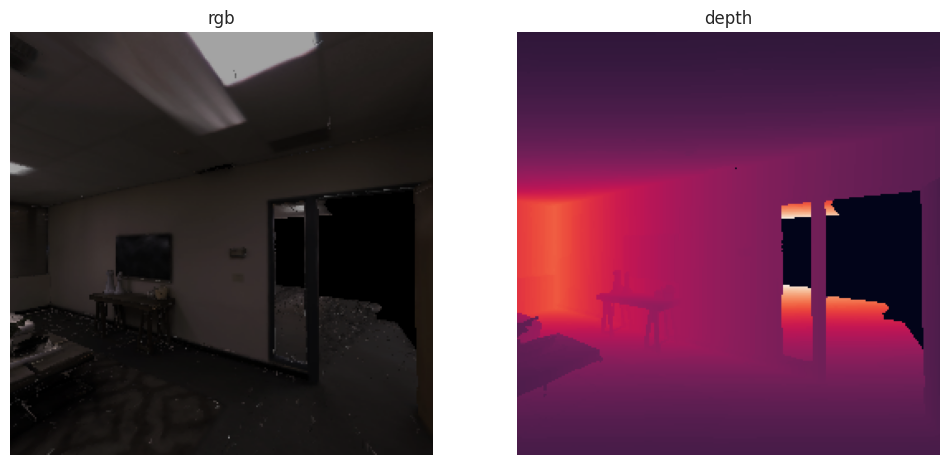

Use WASD to control the agent now (Q to quit): 
Invalid input . Please only use WASD!
Use WASD to control the agent now (Q to quit): d
Choose to turn_right


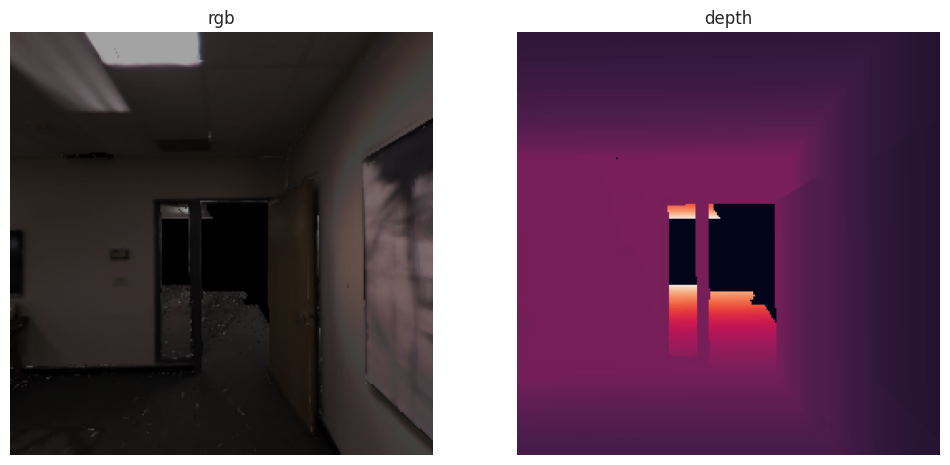

Use WASD to control the agent now (Q to quit): d
Choose to turn_right


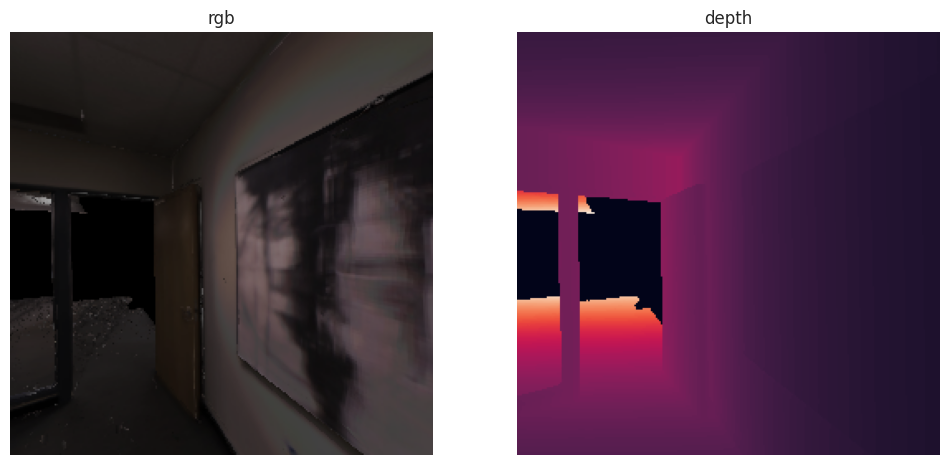

Use WASD to control the agent now (Q to quit): q
Bye...


In [13]:
import time
key_bindings = {
    'W': 'move_forward',
    'A': 'turn_left',
    'S': 'move_backward',
    'D': 'turn_right',
}
while True:
    time.sleep(0.5) # Needed in COLAB becuase it's silly when running a plt.show() and input() next to each other
    key_pressed = input('Use WASD to control the agent now (Q to quit): ')
    key_pressed = key_pressed.upper()
    if key_pressed == 'Q':
        print("Bye...")
        break
    elif key_pressed in key_bindings.keys():
        action = key_bindings[key_pressed]
        print(f"Choose to {action}")

        # TODO(student): Take a simulation step and render the observations using display_obs()
        obs = sim.step(action)
        display_obs(obs["color_sensor"], obs["depth_sensor"])
    else:
        print(f"Invalid input {key_pressed}. Please only use WASD!")

# The NavMesh

In the previous section, we took the implementation of the agent's "interaction" with its environment for granted (i.e. collisions, navigation contraints, etc). By default, these are enabled in the discrete HabitatSim action space. However, if we naiively updated the agent state (its position and orientation) it wouldn't sense the boundary of the scenes or obstacles when taking its actions.

To enable these constraints during navigation, HabitatSim uses a lightweight and fast "NavMesh" representation, by integrating a poopular Navmesh generation library [Recast Navigation | Detour](https://github.com/recastnavigation/recastnavigation) through the [nav module](https://aihabitat.org/docs/habitat-sim/habitat_sim.nav.html).

### What is a NavMesh?
A navigation mesh (NavMesh) is a collection of two-dimensional convex polygons (i.e., a polygon mesh) that define which areas of an environment are traversable by an agent with a particular embodiment. This representation prevents the agent from freely navigating around areas in the scene that contain large objects, walls, gaps, or other barriers.

The NavMesh (an example shown in the image below) is computed by voxelizing the static scene and generating polygons on the top surfaces of solid voxels where the agent (approximated as a cyllinder) would sit without intersection or overhanging and respecting configured constraints such as maximum climbable slope and step-height.

<div>
<img src="https://github.com/recastnavigation/recastnavigation/raw/main/Docs/Images/screenshot.png" width="600"/>
</div>

### Visualizing the NavMesh
The NavMesh is a 3D mesh, but the [PathFinder API](https://aihabitat.org/docs/habitat-sim/habitat_sim.nav.PathFinder.html) makes it easy to produce a topdown map of navigatability in the scene. However, many of the scenes we'll work with have multiple floors, so we'll need to slice the NavMesh at specific world height. A top-down map can then be created by sampling the NavMesh at configurable resolution (`meter_per_pixel`) with 0.5 m of verticle sampling height.

The NavMesh bounds are: (Vector(-0.960305, -1.80025, -2.59948), Vector(6.94256, 2.7438, 8.14176))


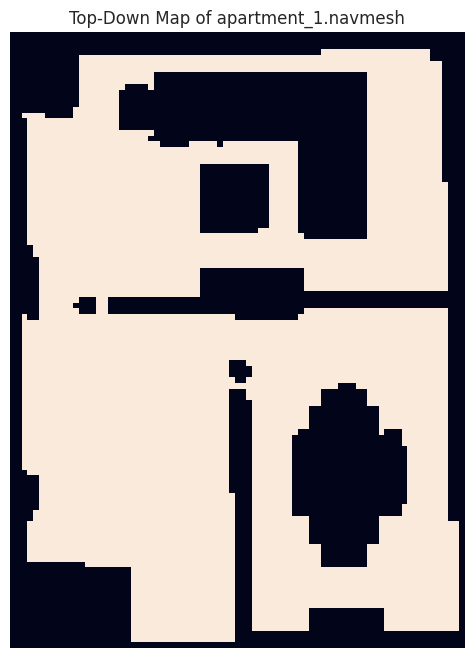

In [14]:
# display a topdown map with matplotlib
def display_map(topdown_map, key_points=None):
    plt.figure(figsize=(12, 8))
    plt.title("Top-Down Map of apartment_1.navmesh")
    ax = plt.subplot(1, 1, 1)
    ax.axis("off")
    plt.imshow(topdown_map)


# Configure example params
meters_per_pixel = 0.1
custom_height = False
height = 1

print("The NavMesh bounds are: " + str(sim.pathfinder.get_bounds()))
if not custom_height:
    # get bounding box minimum elevation for automatic height
    height = sim.pathfinder.get_bounds()[0][1]


sim_topdown_map = sim.pathfinder.get_topdown_view(meters_per_pixel, height)
display_map(sim_topdown_map)

`TODO(student):` Describe the world coordinate frame with respect to the image above. In other words, what directions are world x, world y, and world z. **(10 Points)**

**Answer Here**
In the top-down NavMesh map, the X–Z plane represents the ground. The right direction in the image corresponds to increasing X, the downward direction corresponds to increasing Z, and the Y-axis (height) extends out of the screen. 

### Using the NavMesh
The navmesh can be used to very quickly determine which locations are "navigatable" and can also compute valid paths between different locations in the scene.

`TODO(student):` Use the [habitat_sim](https://aihabitat.org/docs/habitat-sim/habitat_sim.nav.html) documentation to fill out the below code block to find an optimal path between a randomly sampled start and end point **(10 points)**

In [22]:
import magnum as mn
import numpy as np

seed = 6
sim.pathfinder.seed(seed)

#TODO(student): Sample valid points on the NavMesh for agent spawn location and pathfinding goal.
sample1 = sim.pathfinder.get_random_navigable_point()
sample2 = sim.pathfinder.get_random_navigable_point()

print("Start position", sample1)
print("End position", sample2)



#TODO(student): Use the ShortestPath module to compute path between samples.
path = habitat_sim.nav.ShortestPath()
path.requested_start = sample1
path.requested_end = sample2

found_path = sim.pathfinder.find_path(path)
geodesic_distance = path.geodesic_distance
path_points = path.points

# print the output
print("found_path : " + str(found_path))
print("geodesic_distance : " + str(geodesic_distance))
print(f"path_points (size={len(path_points)}): " + str(path_points))

Start position Vector(6.06313, -1.60025, 4.05707)
End position Vector(6.20601, -1.60025, 1.79848)
found_path : True
geodesic_distance : 11.973868370056152
path_points (size=10): [Vector(6.06313, -1.60025, 4.05707), Vector(5.2397, -1.60025, 3.55052), Vector(4.8397, -1.60025, 3.45052), Vector(2.9897, -1.40025, 3.45052), Vector(0.689695, -1.60025, 2.30052), Vector(0.639695, -1.40025, 2.15052), Vector(0.739695, -1.60025, 1.90052), Vector(2.3897, -1.60025, 1.45052), Vector(4.0897, -1.60025, 1.40052), Vector(6.20601, -1.60025, 1.79848)]


### Visualizing the Shortest Path
Now that you have a path from two randomly sampled locations on the navmesh, let's visualize it!

`TODO(student):` Implement the TODOs in the functions below to render a computed path in the navmesh projection map **(10 points)**

In [36]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon

def world_to_grid(world_points, bounds, meters_per_pixel, H, W):
    """
    Convert world points (px, py, pz) to image (row, col) for a map built with get_topdown_view.
    """
    #TODO(student): Implement this function
    x_min, y_min, z_min = bounds[0]
    x_max, y_max, z_max = bounds[1]
    x = world_points[:, 0]
    z = world_points[:, 2]

    # Convert world (x,z) to grid coordinates (row, col)
    col = (x - x_min) / meters_per_pixel
    row = (z- z_min) / meters_per_pixel

    # clip to map
    row = np.clip(row, 0, H - 1)
    col = np.clip(col, 0, W - 1)

    return row, col  # (row, col)

def draw_path_on_axes(ax, traj_grid, linewidth=2, color="black", label="geodesic distance"):
    if len(traj_grid) < 2:
        return
    rows = [rc[0] for rc in traj_grid]
    cols = [rc[1] for rc in traj_grid]
    ax.scatter(cols, rows, color=color)
    ax.plot(cols, rows, linewidth=linewidth, linestyle="--", color=color, label=label)

def draw_poly_on_axes(ax, center_rc, heading_rad, agent_radius_px=8, vertices=3, color="black", label="agent"):
    """
    Draw a small marker
    """
    r, c = center_rc
    triangle = RegularPolygon(
        (c, r),
        numVertices=vertices,
        radius=agent_radius_px,
        orientation=heading_rad,
        edgecolor=color,
        facecolor=color,
        linewidth=1.5,
        alpha=0.95,
        label=label
    )
    ax.add_patch(triangle)

# ---------- main helper ----------
def show_topdown_with_path(
    top_down_map,
    scene_bounds,
    path_points,                 # list of world points (x, y, z)
    meters_per_pixel=0.1,
    agent_radius_px=8,
    recolor_map=((0,0,0),(255,255,255)),  # (obstacle, navigable)
    title="navmesh"
):
    H, W = top_down_map.shape

    # Recolor to RGB
    obstacle_rgb = np.array(recolor_map[0], dtype=np.uint8)
    navigable_rgb = np.array(recolor_map[1], dtype=np.uint8)
    topdown_rgb = np.zeros((H, W, 3), dtype=np.uint8)
    topdown_rgb[~top_down_map] = obstacle_rgb
    topdown_rgb[top_down_map]  = navigable_rgb

    # Convert world (x,z) -> grid (row,col)
    traj_grid = []
    #TODO(student): Convert path_points from world frame to map grid (rol, col)
    # and store in traj_grid
    rows, cols = world_to_grid(np.array(path_points), scene_bounds, meters_per_pixel, H, W)
    traj_grid = list(zip(rows, cols))

    # Plot
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis("off")
    ax.imshow(topdown_rgb)
    draw_path_on_axes(ax, traj_grid, linewidth=2.5, color="red", label="path")
    if len(traj_grid) > 0:
        draw_poly_on_axes(ax, traj_grid[0], 0, agent_radius_px=agent_radius_px, color="green", vertices=3, label="agent start") # agent starter position
        draw_poly_on_axes(ax, traj_grid[-1], 0, agent_radius_px=agent_radius_px, color="red", vertices=8, label="agent end") # agent final position

    plt.legend()
    plt.title(title)
    plt.show(block=False)

    return topdown_rgb, traj_grid


Render the top-dopwn map with the shortest path rendered on top of it.

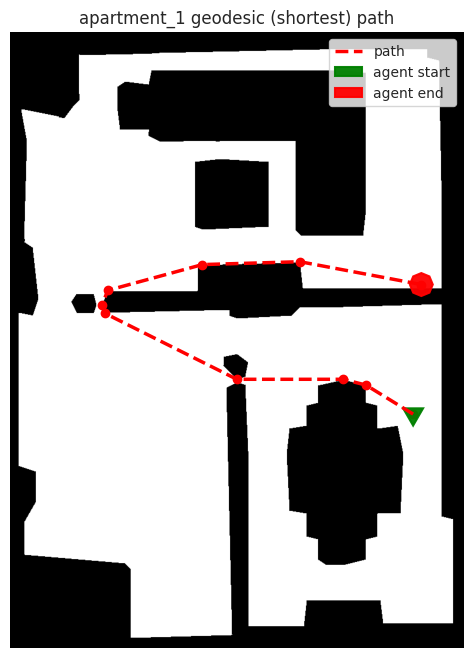

In [37]:
meters_per_pixel = 0.01
height = sim.pathfinder.get_bounds()[0][1]

top_down_map = sim.pathfinder.get_topdown_view(meters_per_pixel, height)
bounds = sim.pathfinder.get_bounds()

rgb_map, traj_grid = show_topdown_with_path(top_down_map, bounds, path_points, meters_per_pixel, agent_radius_px=0.2/meters_per_pixel, title="apartment_1 geodesic (shortest) path")


### Take observations along the shortest path

`TODO(student):` Now, given that we have the shortest path, take observations along the path. Update the agent's position so that it follows the path. The agent should take short steps (< 20cm) increments and should always be oriented towards the next waypoint. **(10 points)**

I recommend doing the following:
1. Update the path to make a more *discritized* path
2. Loop through the new discritized path, updating the position and orientation of the agent and taking observartions.

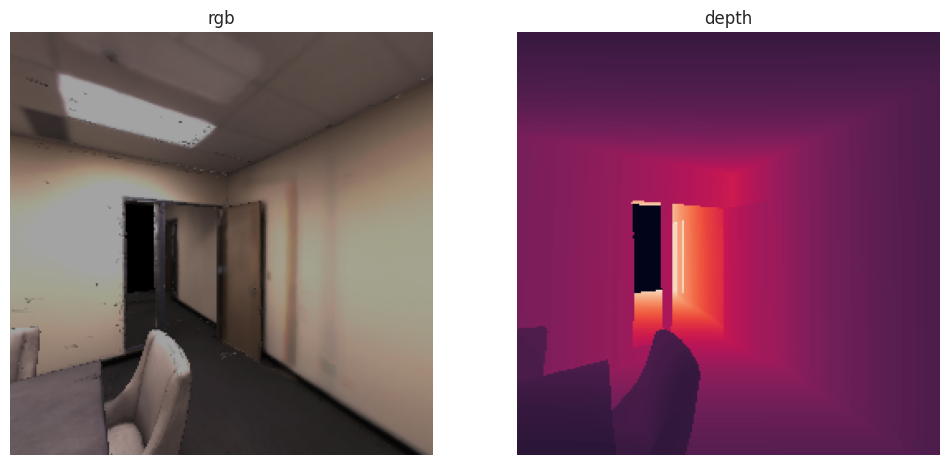

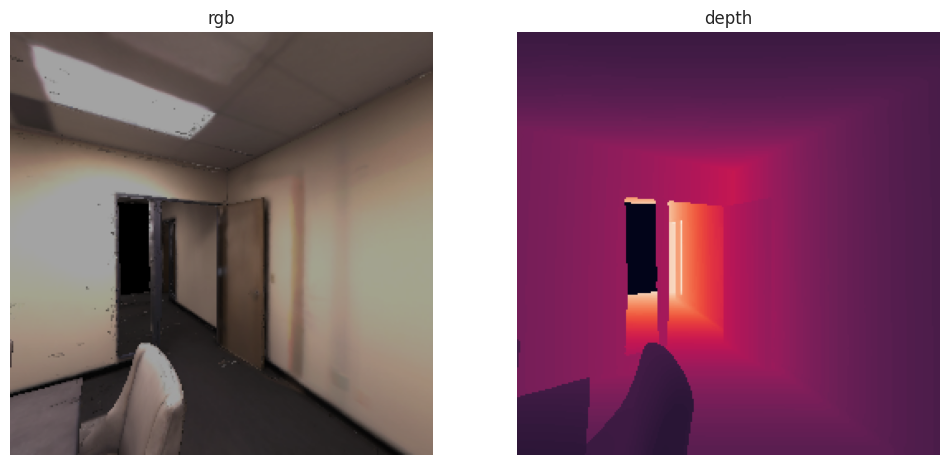

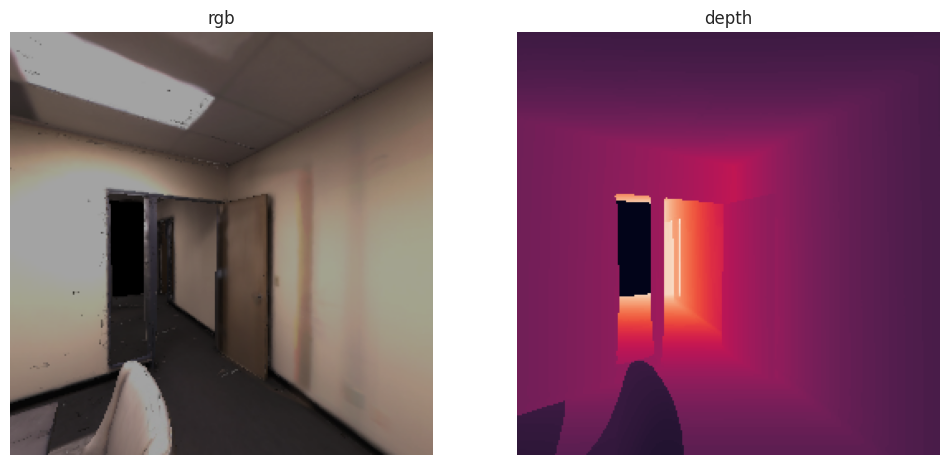

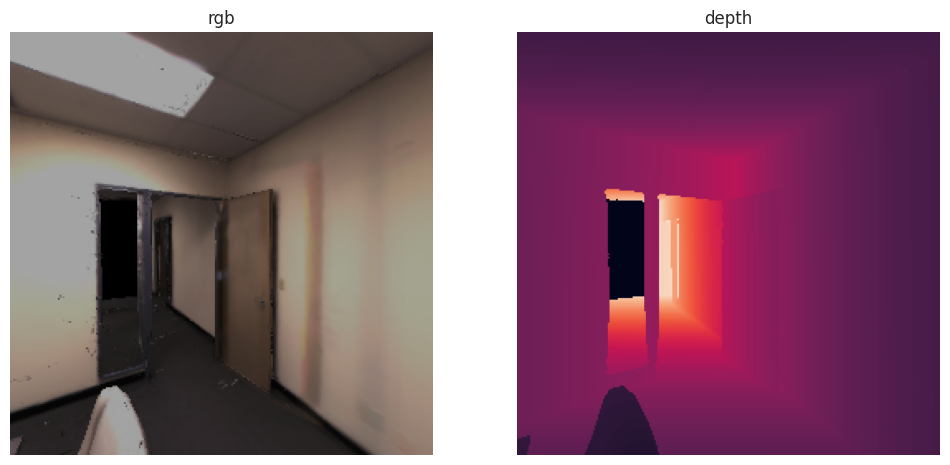

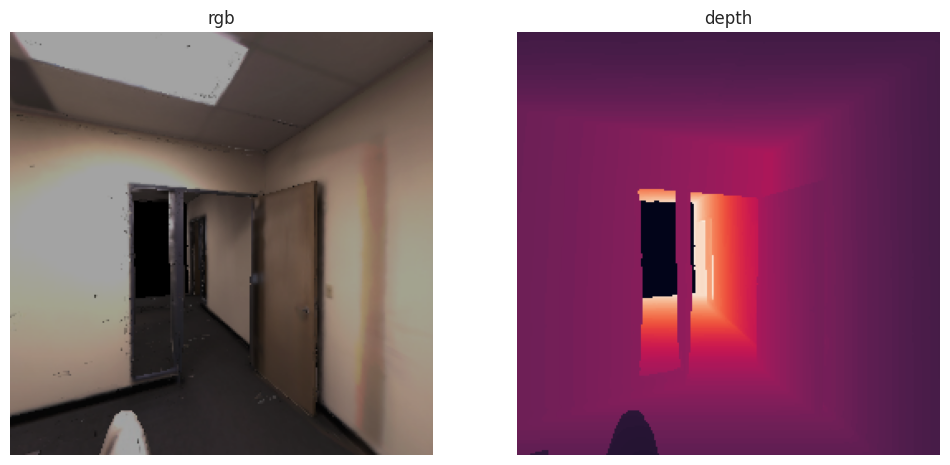

...

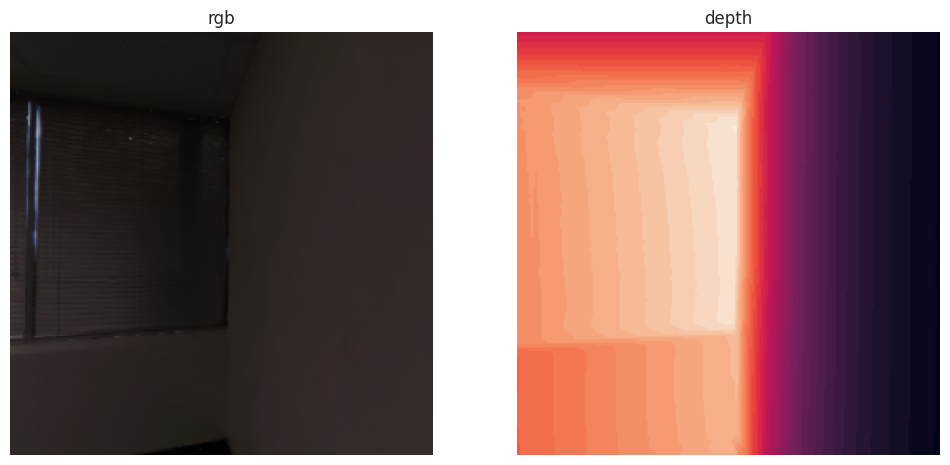

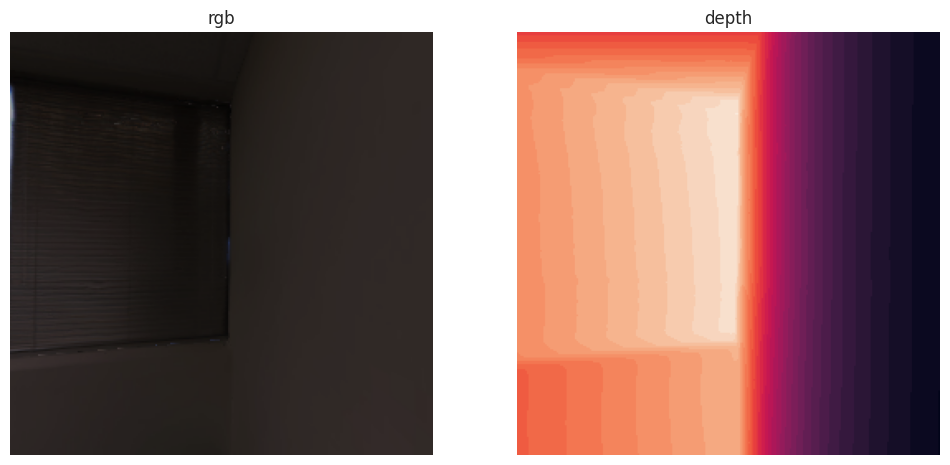

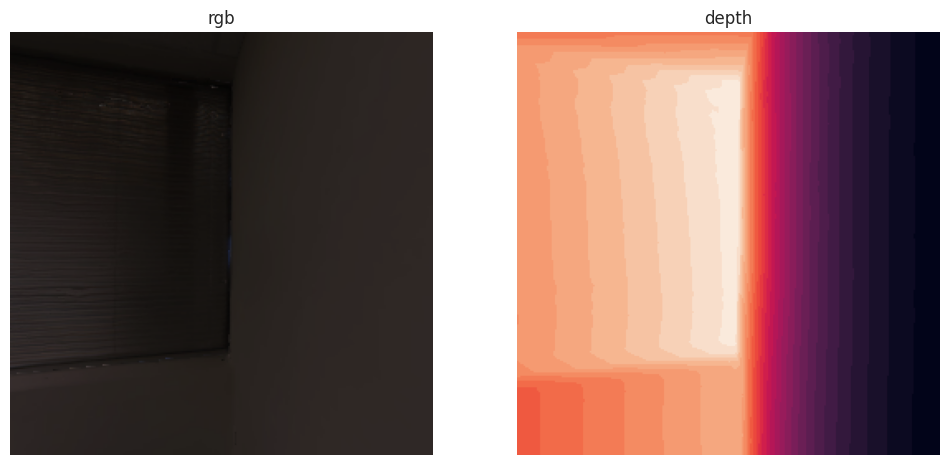

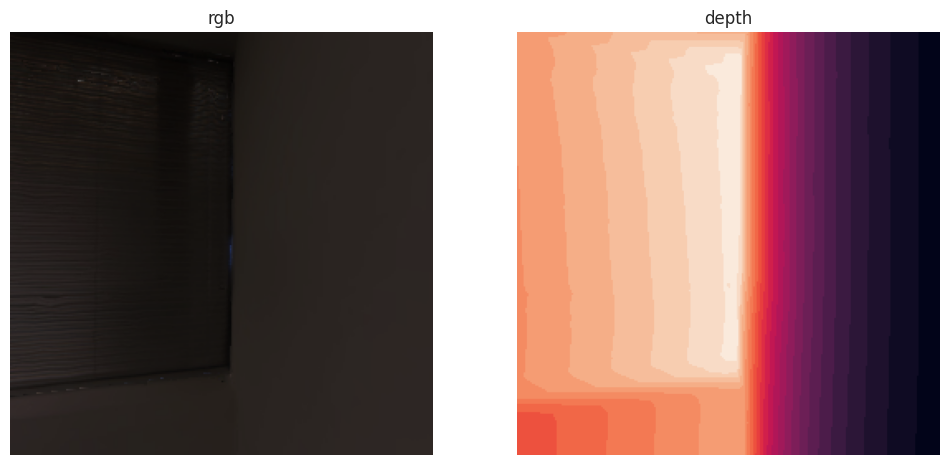

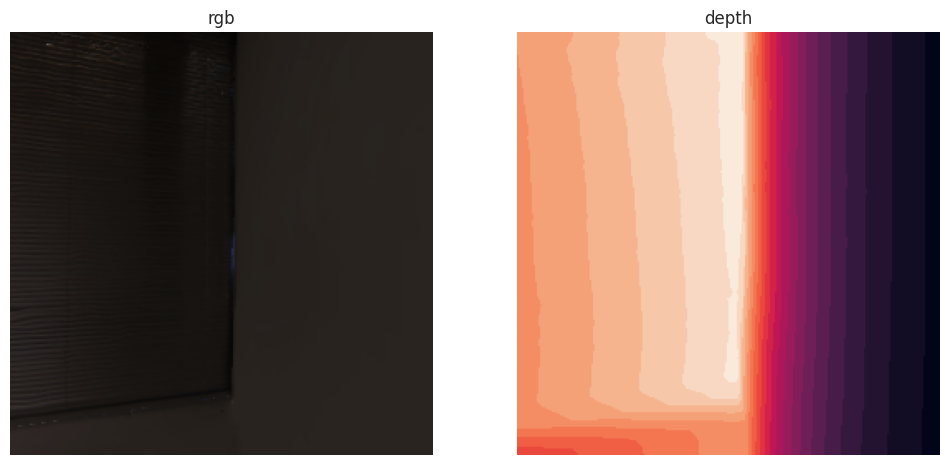

In [45]:
import magnum as mn
from habitat_sim.utils import common as utils


# TODO(student): You may find the following library functions useful:
# 1. agent.set_state(), as above
# 2. mn.Matrix4.look_at (https://doc.magnum.graphics/python/magnum/Matrix4/#look_at)
# 3. mn.Quaternion.from_matrix (https://doc.magnum.graphics/python/magnum/Quaternion/#from_matrix)
# 4. utils.quat_from_magnum() to convert quaternion conventions from magnum to what agent_state expects.

# TODO(student): Update the path_points
new_path_points = [path_points[0]]
step_size = 0.2

for i in range(1, len(path_points)):
    p0 = np.array(path_points[i - 1])
    p1 = np.array(path_points[i])
    segment = p1 - p0
    dist = np.linalg.norm(segment)
    if dist == 0:
        continue
    direction = segment / dist

    num_steps = int(np.floor(dist / step_size))
    for j in range(1, num_steps + 1):
        new_point = p0 + direction * step_size * j
        new_path_points.append(new_point)

# TODO(student): Get observations from the env
observations = []
for p in range(1, len(new_path_points)):
    agent_state = agent.get_state()

    start = new_path_points[p - 1]
    next = new_path_points[p]

    # Define orientation
    eye = mn.Vector3(start[0], start[1], start[2])
    target = mn.Vector3(next[0], next[1], next[2])
    up = mn.Vector3.y_axis()

    # Convert to quaternion
    look_at_matrix = mn.Matrix4.look_at(eye, target, up)
    orient_quat = mn.Quaternion.from_matrix(look_at_matrix.rotation())
    habitat_quat = utils.quat_from_magnum(orient_quat)

    # Set agent pose
    agent_state.position = start
    agent_state.rotation = habitat_quat
    agent.set_state(agent_state)

    # Get observation
    obs = sim.get_sensor_observations()
    observations.append(obs)

# Display observations
for i, obs in enumerate(observations):
    rgb_obs = obs.get("color_sensor", None)
    depth_obs = obs.get("depth_sensor", None)
    display_obs(rgb_obs, depth_obs)

### Construct a Greedy Trajectory Following Agent
Often times, the agent's action space prohibits it from following the shortest path perfectly. This is especially apparent when the agent uses discrete actions (i.e. `turn_left`, `move_forward`) like in our case.

Thankfully, HabitatSim actually implements this trajectory following agent in the [GreedyGeodesicFollower Class](https://aihabitat.org/docs/habitat-sim/habitat_sim.nav.GreedyGeodesicFollower.html) in the nav module.

`TODO(student):` Use the GreedyGeodesicFollower to find an action sequence that takes the agent from the start_pos to the goal_pos. The agent should terminate if it gets within 0.15m of the goal. **(10 points)**

In [56]:
from habitat_sim.nav import GreedyGeodesicFollower
start_pos = sample1
goal_pos = sample2

# TODO(student): Implement below
sim.reset()
start_pos = sim.pathfinder.snap_point(start_pos)
goal_pos = sim.pathfinder.snap_point(goal_pos)
agent = sim.get_agent(0)

agent_state = agent.get_state()
agent_state.position = start_pos
agent.set_state(agent_state)

follower = GreedyGeodesicFollower(
    pathfinder=sim.pathfinder,
    agent=agent,
    goal_radius=0.15,
    forward_key="move_forward",
    left_key="turn_left",
    right_key="turn_right",
)
follower.reset()
action_sequence = follower.find_path(goal_pos)
if action_sequence and action_sequence[-1] is None:
    action_sequence = action_sequence[:-1]
print(action_sequence)

['move_forward', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'turn_left', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'move_forward', 'turn_right', 'move_forward', 'move_forward', 'turn_left', 'move_forward', 'move_forward', 'turn_right', 'move_forward', 'move_forward', 'turn_left', 'move_forward', 'move_forward', 'move_forward', 'turn_right', 'turn_right', 'move_forward', 'turn_right', 'turn_right', 'move_forward', 'move_forward', 'turn_right', 'move_forward', 'move_forward', 'move_forward', 'move_forward', 'move_forward', 'move_forward', 'turn_right', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_forward', 'turn_left', 'move_forward', 'turn_right', 'move_fo

`#TODO(student):` Rollout the action sequence produced by the GreedyGeodesicFollower. Then plot its trajectory on the map using `show_topdown_with_path`. **(10 points)**

In [57]:
# TODO (student): Rollout the action sequence
agent_state = agent.get_state()
agent_state.position = start_pos
agent.set_state(agent_state)
trajectory = [start_pos]

for action in action_sequence:
    sim.step(action)
    trajectory.append(agent.get_state().position)

trajectory = np.array(trajectory)

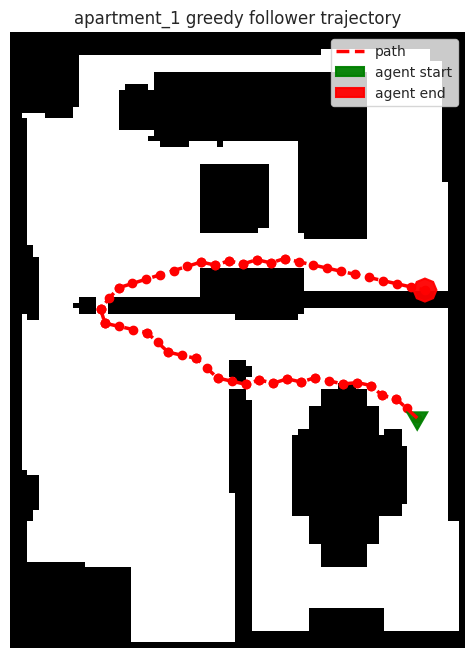

(array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]], dtype=uint8),
 [(66.56545, 70.234375),
  (64.87178, 68.39551),
  (63.1781, 66.55664),
  (63.1781, 66.55664),
  (62.630768, 64.11729),
  (62.630768, 64.11729),
  (60

In [58]:
# TODO (student): Plot trajectory on map
path_points = [mn.Vector3(p[0], p[1], p[2]) for p in trajectory]

# Generate top-down map
meters_per_pixel = 0.1
bounds = sim.pathfinder.get_bounds()
height = bounds[0][1]
top_down_map = sim.pathfinder.get_topdown_view(meters_per_pixel, height)

# Visualize
show_topdown_with_path(
    top_down_map,
    bounds,
    path_points,
    meters_per_pixel,
    agent_radius_px=0.2 / meters_per_pixel,
    title="apartment_1 greedy follower trajectory"
)

### Compute the SPL of the GreedyPathFollower
`TODO(student):` Compute the SPL! **(10 points)**

In [59]:
# TODO(Student): Compute the SPL for this episode. Make sure to check if it successfully reached the goal location (<0.15m of err)
from habitat_sim.nav import ShortestPath
import numpy as np

# --- Helper Function ---
def calculate_path_distance(points):
    """Compute the total Euclidean distance along a path."""
    deltas = np.diff(points, axis=0)
    segment_lengths = np.linalg.norm(deltas, axis=1)
    return np.sum(segment_lengths)

# --- SPL Evaluation ---
end_position = trajectory[-1]
goal_reached = np.linalg.norm(end_position - goal_pos) < 0.15

# Compute geodesic shortest path
geodesic_path = ShortestPath()
geodesic_path.requested_start = start_pos
geodesic_path.requested_end = goal_pos
_ = sim.pathfinder.find_path(geodesic_path)

optimal_path_length = geodesic_path.geodesic_distance
actual_path_length = calculate_path_distance(trajectory)

# SPL Calculation
if goal_reached and optimal_path_length > 0:
    spl_score = optimal_path_length / max(optimal_path_length, actual_path_length)
else:
    spl_score = 0.0

# --- Results ---
print(f"Goal Reached: {goal_reached}")
print(f"Optimal Path Length (L*): {optimal_path_length:.3f} m")
print(f"Traversed Path Length (L): {actual_path_length:.3f} m")
print(f"SPL Score: {spl_score:.3f}")


Goal Reached: True
Optimal Path Length (L*): 11.974 m
Traversed Path Length (L): 12.349 m
SPL Score: 0.970


# What to Turn In
`#TODO(student):` Please zip the following files and turn them into the assignment on gradescope:
1. this `lab_10_student.ipynb` file. Please make sure to fill our your name and umich ID in the first cell

Please ensure all cell outputs (videos, plots, etc) are in tact when you download the .ipynb file.